In [240]:
from PIL import Image
from pylab import *

In [228]:
im=Image.open('/Users/rozasamyrkanova/Downloads/1318.jpeg')

## Исходное изображение:

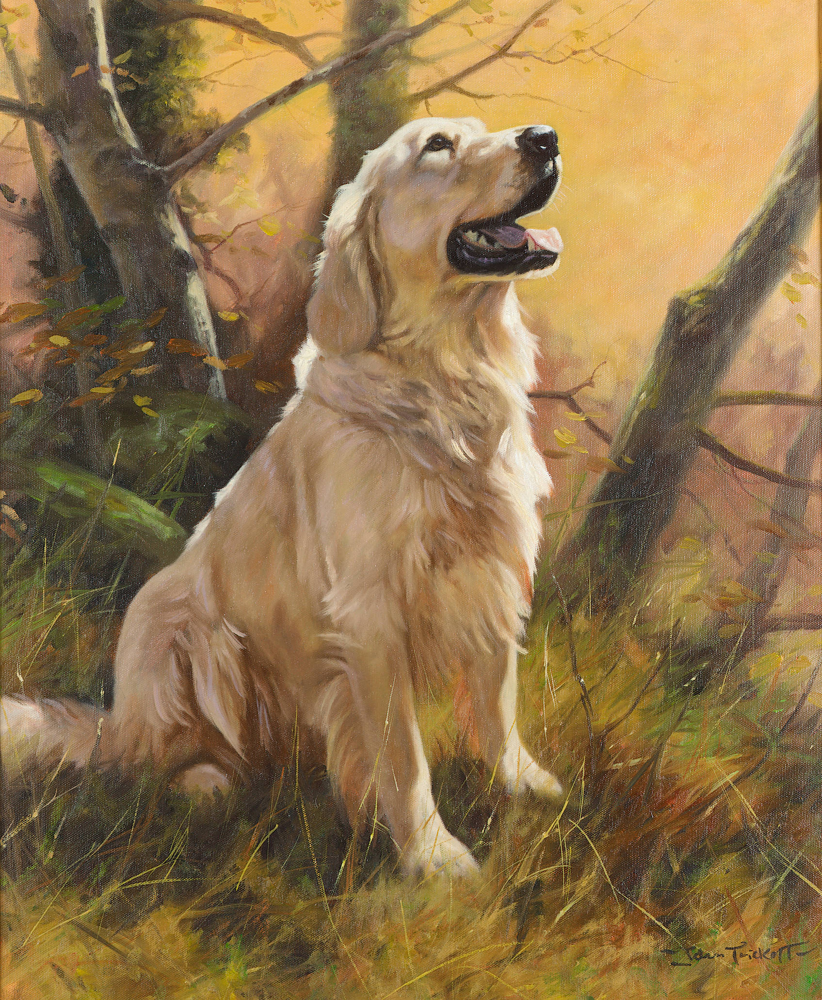

In [229]:
im

## Задание 1. Узнать размеры исходного изображения

In [221]:
width, height = im.size

In [222]:
print(width, height)

1695 2060


## Задание 2. Получить гистограммы по каналам цвета

<Figure size 432x288 with 0 Axes>

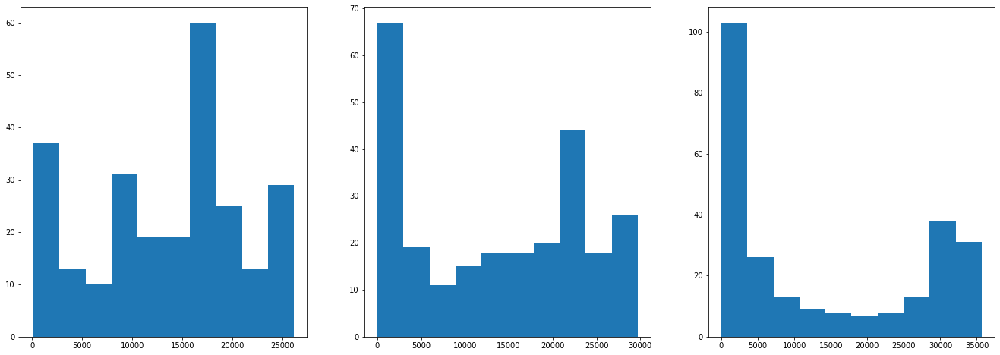

In [232]:
im7 =Image.open('/Users/rozasamyrkanova/Downloads/1318.jpeg')
r, g, b = im7.split()
figure()
plt.figure(figsize=(23, 8))
subplot(1,3,1), hist(r.histogram(),10)
subplot(1,3,2), hist(g.histogram(),10)
subplot(1,3,3), hist(b.histogram(),10)
show()

<Figure size 432x288 with 0 Axes>

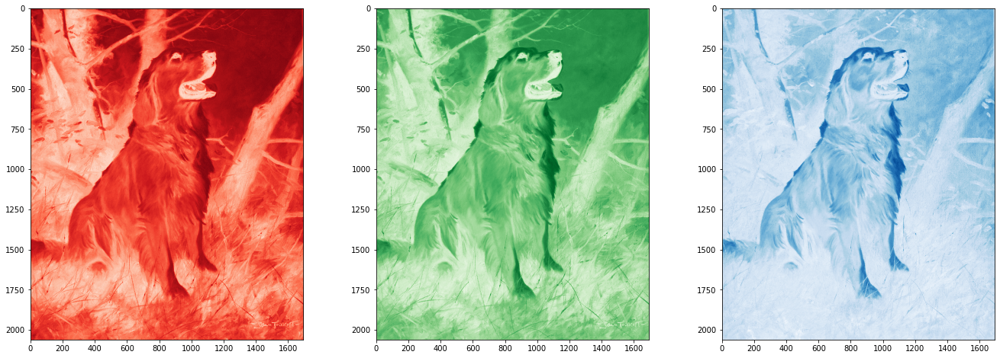

In [239]:
r, g, b = im7.split()
figure()
plt.figure(figsize=(23, 8))
subplot(1,3,1), imshow(np.array(r), cmap='Reds')
subplot(1,3,2), imshow(np.array(g), cmap='Greens')
subplot(1,3,3), imshow(np.array(b), cmap='Blues')
show()

## Задание 3. Для полутонового изображения p1 и его инвертированного изображения постройте гистограммы

In [243]:
im=Image.open('/Users/rozasamyrkanova/Downloads/1318.jpeg')

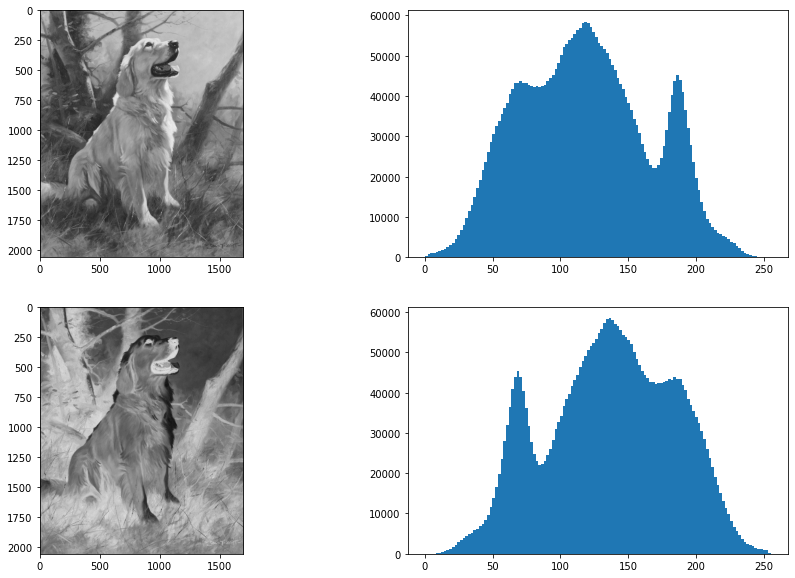

In [245]:
im = array(im.convert('L'))
inv = 255 - np.array(im)
plt.figure(figsize=(15, 10))
subplot(2,2,1), imshow(np.array(im), cmap="gray")
subplot(2,2,2), hist(np.array(im).flatten(), 128)
subplot(2,2,3), imshow(inv, cmap="gray")
subplot(2,2,4), hist(np.array(inv).flatten(), 128)
show()

In [ ]:
pim4 = Image.fromarray(uint8(inv)) 

In [ ]:
pim4.save('/Users/rozasamyrkanova/Downloads/pim4.jpg')

## Задание 4. Измените яркость полутонового изображения p1 с помощью квадратичной функции, постройте гистограмму получившегося изображения

In [187]:
im5 = 255.0*(im/255)**2

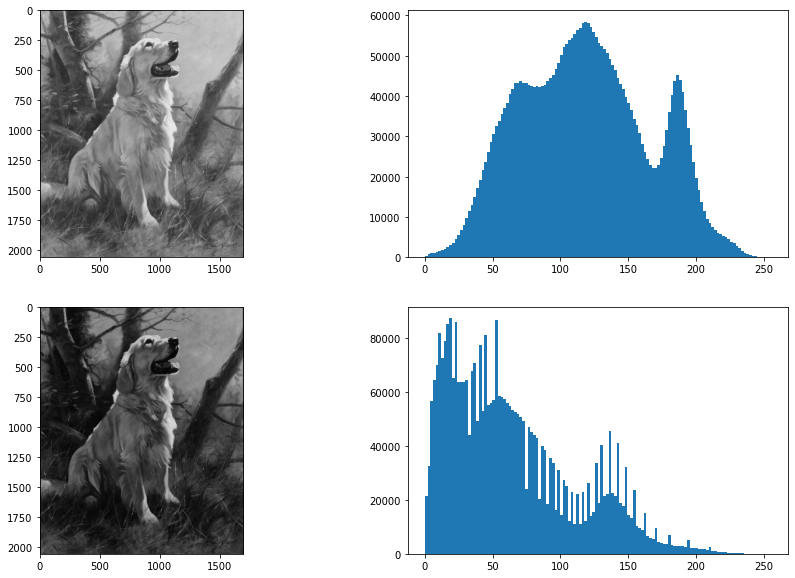

In [189]:
plt.figure(figsize=(15, 10))
subplot(2,2,1), imshow(np.array(im), cmap="gray")
subplot(2,2,2), hist(np.array(im).flatten(), 128)
subplot(2,2,3), imshow(im5, cmap="gray")
subplot(2,2,4), hist(np.array(im5).flatten(), 128)
show()

In [19]:
pim5 = Image.fromarray(uint8(im5)) 

In [20]:
pim5.save('/Users/rozasamyrkanova/Downloads/pim5.jpg')

## Задание 5. Выровните гистограмму изображения p1 с помощью кумулятивной функции распределения значений пикселей в изображении.

In [21]:
def hst(im, ib=256):
    imh, b = histogram(im.flatten(),ib,normed=True)
    cdf = imh.cumsum()
    cdf = 255*cdf/cdf[-1]
    im2 = interp(im.flatten(),b[:-1],cdf)
    return im2.reshape(im.shape), cdf

im6, cdf = hst(im)
pim6 = Image.fromarray(uint8(im6)) 
pim6.save('/Users/rozasamyrkanova/Downloads/pim6.jpg')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  


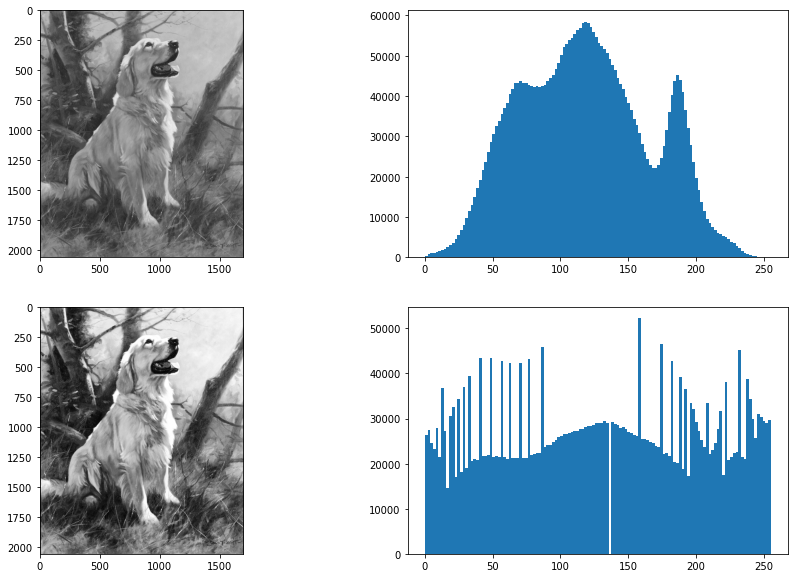

In [29]:
plt.figure(figsize=(15, 10))
subplot(2,2,1), imshow(np.array(im), cmap="gray")
subplot(2,2,2), hist(np.array(im).flatten(), 128)
subplot(2,2,3), imshow(im6, cmap="gray")
subplot(2,2,4), hist(np.array(im6).flatten(), 128)
show()

## Задание 6. Выровните гистограмму изображения p1 с помощью вычисления частного: разделите изображение на его размытый вариант.

In [30]:
from scipy.ndimage import filters

In [122]:
im10 = 2*im/im8
im11, cdf = hst(im10)
pim11 = Image.fromarray(uint8(im11)) 
pim11.save('/Users/rozasamyrkanova/Downloads/pim11.jpg')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  


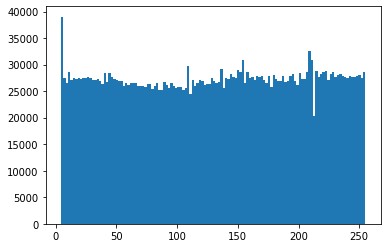

In [123]:
hist(im11.flatten(),128)
show()

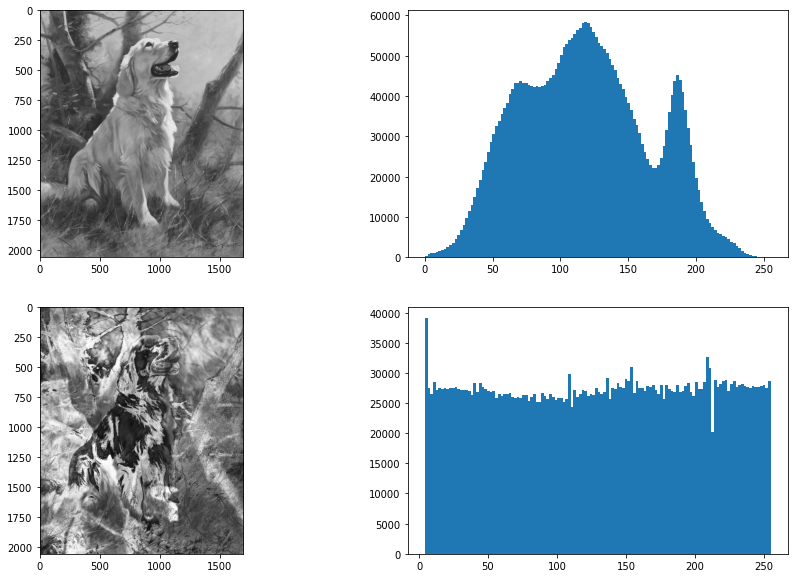

In [124]:
plt.figure(figsize=(15, 10))
subplot(2,2,1), imshow(np.array(im), cmap="gray")
subplot(2,2,2), hist(np.array(im).flatten(), 128)
subplot(2,2,3), imshow(im11, cmap="gray")
subplot(2,2,4), hist(np.array(im11).flatten(), 128)
show()

## 7. Выполните размытие изображения по Гауссу с произвольным значением . Нарисуйте изолинии для различных значений и сравните их.

In [41]:
im8 = filters.gaussian_filter(im, 5)[::-1]
im81 = filters.gaussian_filter(im, 15)[::-1]
im82 = filters.gaussian_filter(im, 30)[::-1]

<Figure size 432x288 with 0 Axes>

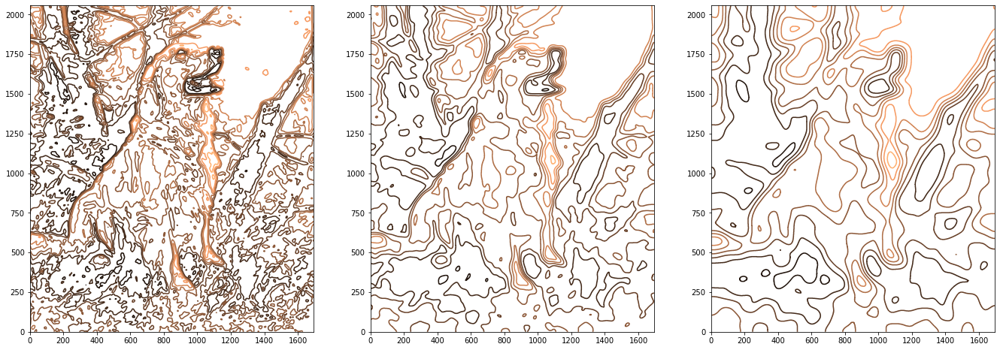

In [212]:
figure()
plt.figure(figsize=(23, 8))
subplot(1,3,1), matplotlib.pyplot.contour(im8, cmap='copper')
subplot(1,3,2), matplotlib.pyplot.contour(im81, cmap='copper')
subplot(1,3,3), matplotlib.pyplot.contour(im82, cmap='copper')
show()

<Figure size 432x288 with 0 Axes>

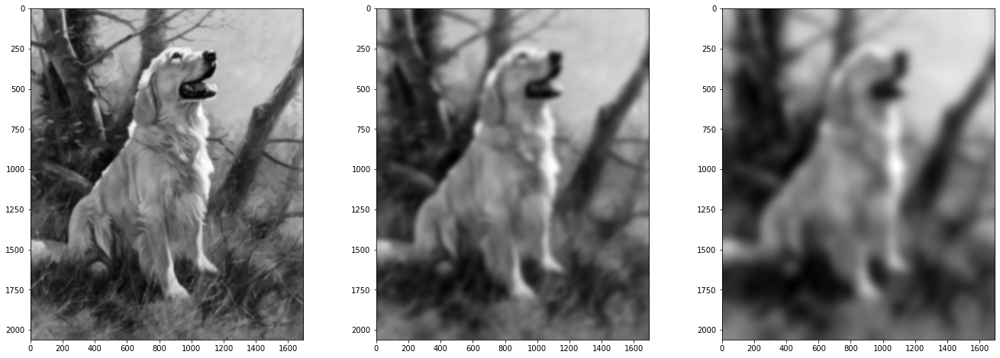

In [192]:
figure()
plt.figure(figsize=(23, 8))
subplot(1,3,1), imshow(np.array(im8)[::-1], cmap="gray")
subplot(1,3,2), imshow(np.array(im81)[::-1], cmap="gray")
subplot(1,3,3), imshow(np.array(im82)[::-1], cmap="gray")
show()

## 8. Найдите границы изображения p1 c помощью фильтра Гаусса и операторов Собеля (+ оператор Прюитта)

In [47]:
s = 5

In [48]:
imx = zeros(im.shape)

<Figure size 432x288 with 0 Axes>

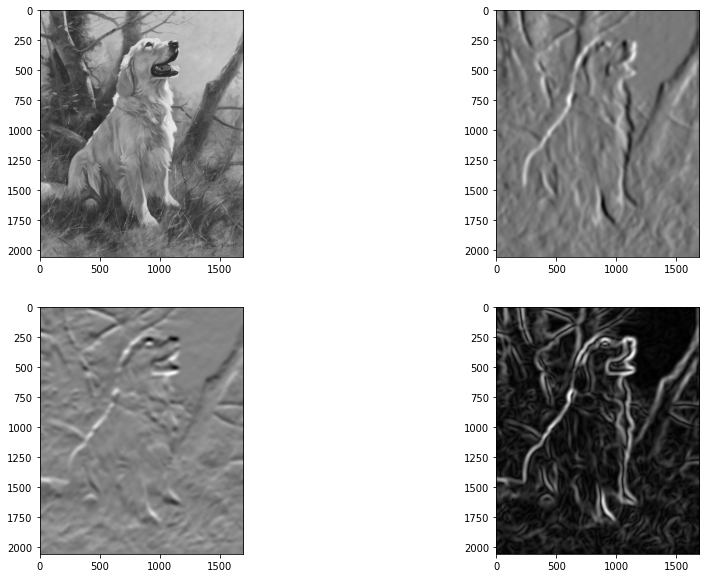

In [49]:
s = 15
imx = zeros(im.shape)
filters.gaussian_filter(im, (s,s),(0,1),imx)
imy = zeros(im.shape)
filters.gaussian_filter(im, (s,s),(1,0),imy)
m = sqrt(imx**2+imy**2)
figure()
gray
plt.figure(figsize=(15, 10))
subplot(2,2,1), imshow(im, cmap="gray")
subplot(2,2,2), imshow(imx, cmap="gray")
subplot(2,2,3), imshow(imy, cmap="gray")
subplot(2,2,4), imshow(m, cmap="gray")
show()

<Figure size 432x288 with 0 Axes>

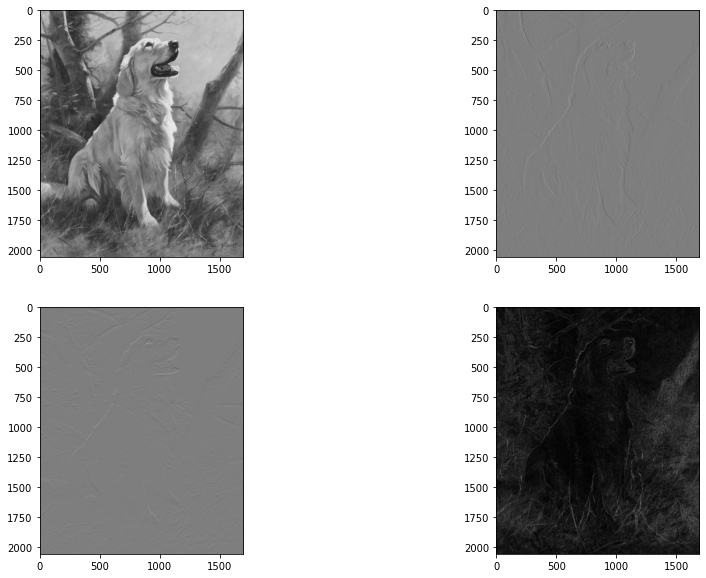

In [50]:
imx = zeros(im.shape)
filters.sobel(im,1,imx)
imy = zeros(im.shape)
filters.sobel(im,0,imy)
m = sqrt(imx**2+imy**2)
figure()
gray
plt.figure(figsize=(15, 10))
subplot(2,2,1), imshow(im, cmap="gray")
subplot(2,2,2), imshow(imx, cmap="gray")
subplot(2,2,3), imshow(imy, cmap="gray")
subplot(2,2,4), imshow(m, cmap="gray")
show()

In [51]:
import scipy

In [52]:
scipy.ndimage.prewitt(im, axis=-1,output=None,mode='reflect', cval=0.0)

array([[155, 244,  35, ..., 236,  24,  23],
       [115, 202,  67, ..., 244,  46,  32],
       [ 85, 169,  79, ..., 247,  70,  42],
       ...,
       [115, 128, 210, ...,  87,  22, 160],
       [122, 152, 247, ..., 140,  71, 166],
       [119, 149, 253, ..., 157, 112, 180]], dtype=uint8)

<Figure size 432x288 with 0 Axes>

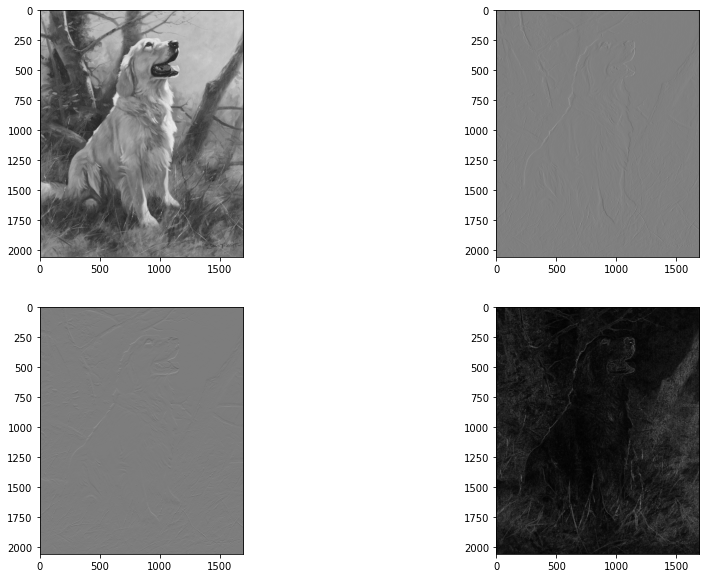

In [53]:
imx = zeros(im.shape)
filters.prewitt(im,1,imx)
imy = zeros(im.shape)
filters.prewitt(im,0,imy)
m = sqrt(imx**2+imy**2)
figure()
gray
plt.figure(figsize=(15, 10))
subplot(2,2,1), imshow(im, cmap="gray")
subplot(2,2,2), imshow(imx, cmap="gray")
subplot(2,2,3), imshow(imy, cmap="gray")
subplot(2,2,4), imshow(m, cmap="gray")
show()

## 9. Бинаризируйте изображение p1. Вычислите количество разных объектов на нем. Воспользуйтесь функцией бинарного открытия, чтобы убрать перемычки между объектами. Вычислите центры масс для найденных объектов.

In [55]:
from scipy.ndimage import measurements, morphology


кол-во объектов:  21326
кол-во объектов:  99


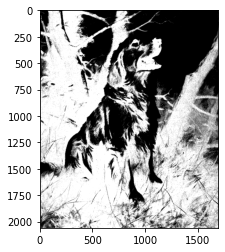

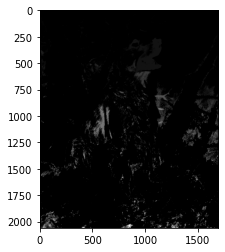

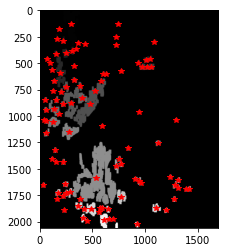

<Figure size 432x288 with 0 Axes>

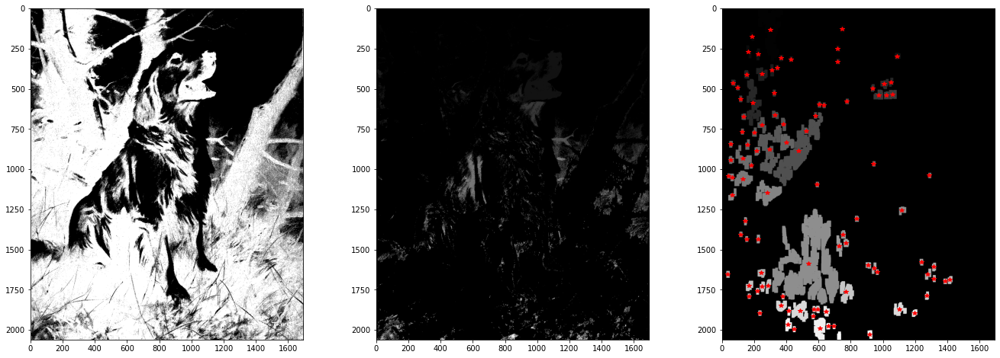

In [213]:
im12=1*(im<128)
l, no=measurements.label(im12)
print("кол-во объектов: ", no)
imshow(im12, cmap="gray")
figure()
imshow(l, cmap="gray")
imop=morphology.binary_opening(im12, ones((9,5)),iterations=4)
lo, no = measurements.label(imop)
figure()
g = measurements.center_of_mass(imop, lo, range(1,99)) 
imshow(lo, cmap="gray")
for x, y in g:
    plot(y,x, 'r*')
#pim1=Image.fromarray(uint8(lo))
print("кол-во объектов: ", no)
show()

figure()
plt.figure(figsize=(23, 8))
subplot(1,3,1), imshow(im12, cmap="gray")
subplot(1,3,2), imshow(l, cmap="gray")
subplot(1,3,3), imshow(lo, cmap="gray")
for x, y in g:
    plot(y,x, 'r*')
show()

## 10. Выполните операцию нерезкого маскирования для p1 (полутоновому и полутоновому и цветному)

In [102]:
imq=Image.open('/Users/rozasamyrkanova/Downloads/1318.jpeg')
imq = imq.convert('L')

In [106]:
imq2 = filters.gaussian_filter(imq, 5)

In [107]:
imq3 = 2*np.array(imq) - np.array(imq2)

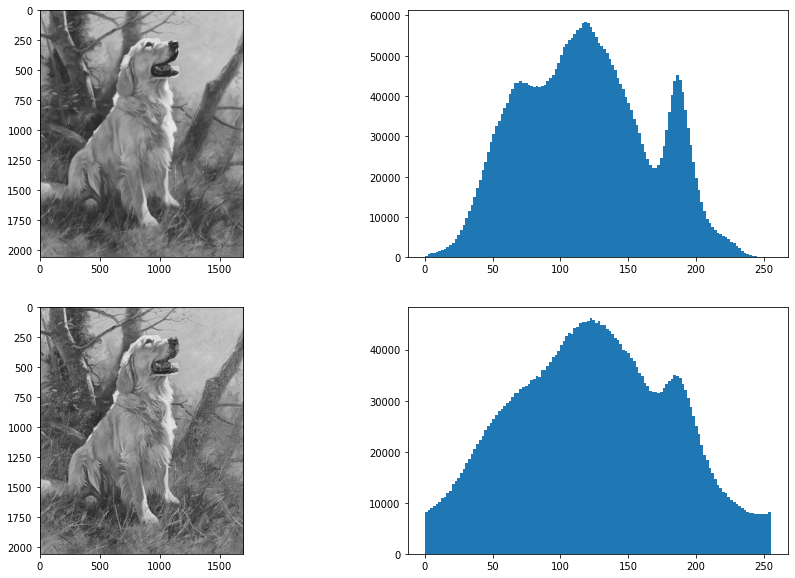

In [108]:
plt.figure(figsize=(15, 10))
subplot(2,2,1), imshow(imq, cmap='gray')
subplot(2,2,2), hist(np.array(imq).flatten(), 128)
subplot(2,2,3), imshow(imq3, cmap='gray')
subplot(2,2,4), hist(np.array(imq3).flatten(), 128)
show()

In [116]:
imq=Image.open('/Users/rozasamyrkanova/Downloads/1318.jpeg')
imq = np.array(imq)

In [120]:
imq2 = zeros(imq.shape)
for i in range(3):
    imq2[:,:,i]=filters.gaussian_filter(imq[:,:,i],5)
imq2 = uint8(imq2)
imq3 = 2*np.array(imq) - np.array(imq2)

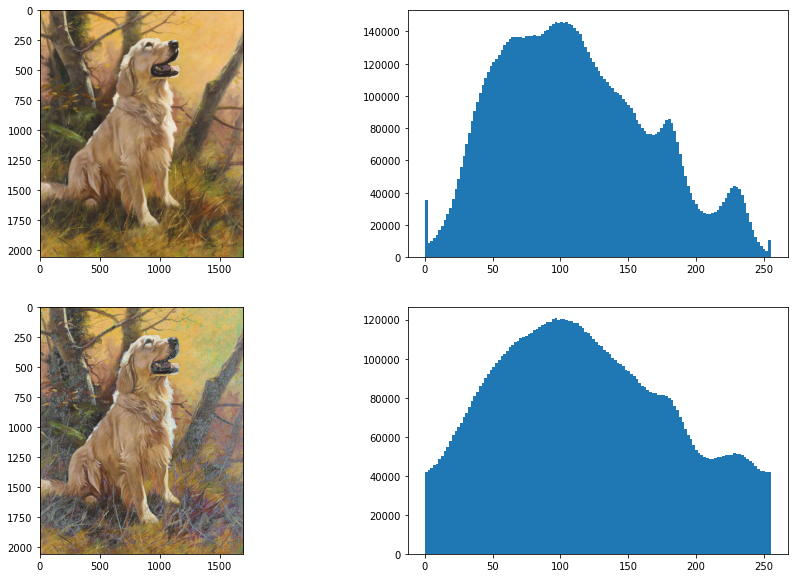

In [121]:
plt.figure(figsize=(15, 10))
subplot(2,2,1), imshow(imq)
subplot(2,2,2), hist(np.array(imq).flatten(), 128)
subplot(2,2,3), imshow(imq3)
subplot(2,2,4), hist(np.array(imq3).flatten(), 128)
show()

## 11. Сегментируйте изображение любыми двумя алгоритмами кластеризации. Взяла алгоритмы k-средних и Hierarchical Clustering

In [125]:
from scipy.cluster.vq import *

(2060, 1695, 3)
[[209.82336  160.05698   93.65669 ]
 [218.72507  171.87465   94.46866 ]
 [201.58405  156.36894   98.63106 ]
 ...
 [146.00285  106.20655   50.276352]
 [139.40314  109.86467   53.43447 ]
 [114.03989  130.09117   58.625355]]


<Figure size 432x288 with 0 Axes>

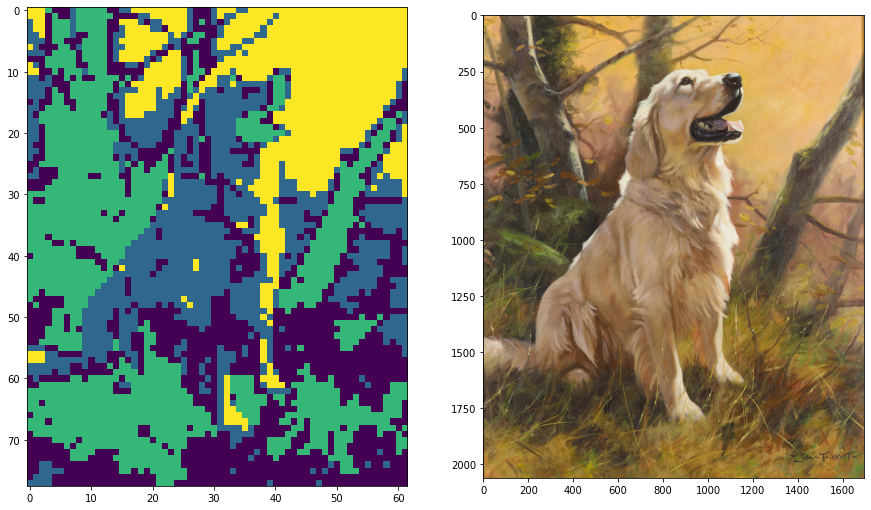

In [216]:
steps1 = 78
steps2 = 62
im = array(Image.open('/Users/rozasamyrkanova/Downloads/1318.jpeg'))
print(im.shape)
dy = im.shape[0] // steps1
dx = im.shape[1] // steps2
features = []
for y in range (steps1):
    for x in range (steps2):
        R = mean(im[y*dy:(y+1)*dy, x*dx:(x+1)*dx, 0])
        G = mean(im[y*dy:(y+1)*dy, x*dx:(x+1)*dx, 1])
        B = mean(im[y*dy:(y+1)*dy, x*dx:(x+1)*dx, 2])
        features.append([R,G,B])
features = array(features, 'f')
print(features)
centroids, variance = kmeans(features, 4)
code, distance = vq(features, centroids)

codeim = code.reshape(steps1, steps2)

figure()
plt.figure(figsize=(15, 10))
subplot(1,2,1), imshow (codeim)
subplot(1,2,2), imshow (im)
show()

In [154]:
from sklearn.cluster import SpectralClustering

(2060, 1695, 3)
[[209.82336  160.05698   93.65669 ]
 [218.72507  171.87465   94.46866 ]
 [201.58405  156.36894   98.63106 ]
 ...
 [146.00285  106.20655   50.276352]
 [139.40314  109.86467   53.43447 ]
 [114.03989  130.09117   58.625355]]


<Figure size 432x288 with 0 Axes>

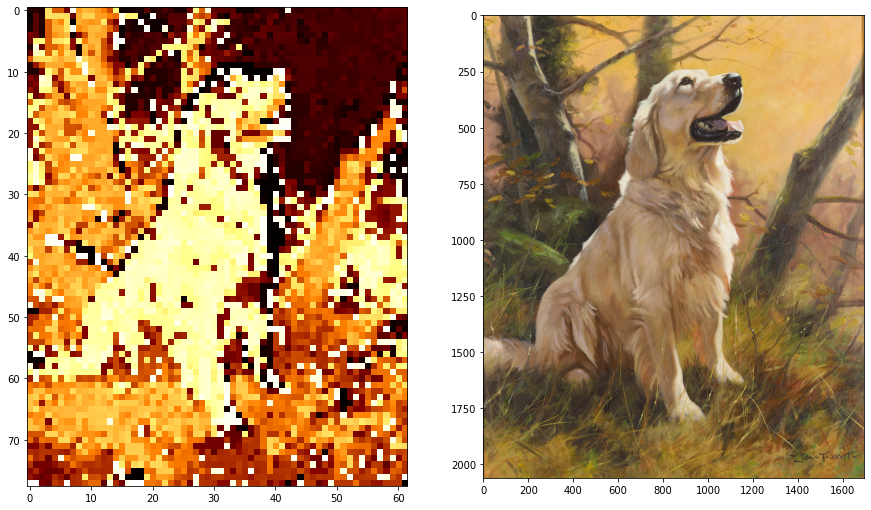

In [217]:
from scipy.cluster.hierarchy import *
from scipy.spatial.distance import pdist
steps1 = 78
steps2 = 62
im = array(Image.open('/Users/rozasamyrkanova/Downloads/1318.jpeg'))
print(im.shape)
dy = im.shape[0] // steps1
dx = im.shape[1] // steps2
features = []
for y in range (steps1):
    for x in range (steps2):
        R = mean(im[y*dy:(y+1)*dy, x*dx:(x+1)*dx, 0])
        G = mean(im[y*dy:(y+1)*dy, x*dx:(x+1)*dx, 1])
        B = mean(im[y*dy:(y+1)*dy, x*dx:(x+1)*dx, 2])
        features.append([R,G,B])
features = array(features, 'f')
print(features)

Z = single(pdist(features))
T = fcluster(Z, 1, criterion='distance')
codeim = T.reshape(steps1, steps2)

figure()
plt.figure(figsize=(15, 10))
subplot(1,2,1), imshow (codeim, cmap='afmhot')
subplot(1,2,2), imshow (im)
show()